# MAHMOUD HAMED ISMAEL 

In [49]:
#importing neccessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import datetime 
import warnings
warnings.filterwarnings('ignore')

import plotly.graph_objs as go
import plotly.offline as py
import plotly.graph_objects as go
import plotly.express as px

import scipy.stats as stats


In [50]:
#load data 
data1=pd.read_csv('train_users_2.csv')
data2=pd.read_csv('test_users.csv')
data1.shape, data2.shape


((213451, 16), (62096, 15))

In [51]:
#merge two data sets 

labels = data1.country_destination.values
id_test = data2.id
data1.drop(['country_destination'], axis = 1)

df_all = pd.concat((data1, data2), axis = 0, ignore_index= True)

df_all.shape


(275547, 16)

In [52]:
df_all.head()


,id,date_account_created,timestamp_first_active,date_first_booking,gender,age,signup_method,signup_flow,language,affiliate_channel,affiliate_provider,first_affiliate_tracked,signup_app,first_device_type,first_browser,country_destination
0,gxn3p5htnn,2010-06-28,20090319043255,NaN,-unknown-,NaN,facebook,0,en,direct,direct,untracked,Web,Mac Desktop,Chrome,NDF
1,820tgsjxq7,2011-05-25,20090523174809,NaN,MALE,38.0,facebook,0,en,seo,google,untracked,Web,Mac Desktop,Chrome,NDF
2,4ft3gnwmtx,2010-09-28,20090609231247,2010-08-02,FEMALE,56.0,basic,3,en,direct,direct,untracked,Web,Windows Desktop,IE,US
3,bjjt8pjhuk,2011-12-05,20091031060129,2012-09-08,FEMALE,42.0,facebook,0,en,direct,direct,untracked,Web,Mac Desktop,Firefox,other
4,87mebub9p4,2010-09-14,20091208061105,2010-02-18,-unknown-,41.0,basic,0,en,direct,direct,untracked,Web,Mac Desktop,Chrome,US


In [53]:
#Finding the number of null in each column.

for i in df_all.columns:
    ab = df_all[i].isnull().sum()
    if ab != 0:
        print(i + " has {} null values.".format(ab))
        print()


date_first_booking has 186639 null values.

age has 116866 null values.

first_affiliate_tracked has 6085 null values.

country_destination has 62096 null values.



In [54]:
df_all.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 275547 entries, 0 to 275546
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   id                       275547 non-null  object 
 1   date_account_created     275547 non-null  object 
 2   timestamp_first_active   275547 non-null  int64  
 3   date_first_booking       88908 non-null   object 
 4   gender                   275547 non-null  object 
 5   age                      158681 non-null  float64
 6   signup_method            275547 non-null  object 
 7   signup_flow              275547 non-null  int64  
 8   language                 275547 non-null  object 
 9   affiliate_channel        275547 non-null  object 
 10  affiliate_provider       275547 non-null  object 
 11  first_affiliate_tracked  269462 non-null  object 
 12  signup_app               275547 non-null  object 
 13  first_device_type        275547 non-null  object 
 14  firs

In [55]:
df_all.gender.value_counts()


-unknown-    129480
FEMALE        77524
MALE          68209
OTHER           334
Name: gender, dtype: int64

In [56]:
df_all.age.describe()

count    158681.000000
mean         47.145310
std         142.629468
min           1.000000
25%          28.000000
50%          33.000000
75%          42.000000
max        2014.000000
Name: age, dtype: float64

In [57]:
#making age between 15 and 100 

df_all[df_all['age']<15].age = np.nan
df_all[df_all['age']>=100].age = np.nan

In [58]:
#Converting below columns as categories for plotting in graphs
categorical_features = [
    'affiliate_channel',
    'affiliate_provider',
    'first_affiliate_tracked',
    'first_browser',
    'first_device_type',
    'gender',
    'language',
    'signup_app',
    'signup_method',
    'signup_flow'
]

for categorical_feature in categorical_features:
    df_all[categorical_feature] = df_all[categorical_feature].astype('category')

In [59]:
df_all['date_account_created'] = pd.to_datetime(df_all['date_account_created'])
df_all['timestamp_first_active'] = pd.to_datetime(df_all['timestamp_first_active'], format='%Y%m%d%H%M%S')


## visualization 

In [60]:
#chose style 
sns.set_style('whitegrid') #whitegrid,darkgrid
sns.set_context("talk") #talk,poster,notebook

#add colores for plot bars
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd',
          '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf'] 


-unknown-    129480
FEMALE        77524
MALE          68209
OTHER           334
Name: gender, dtype: int64

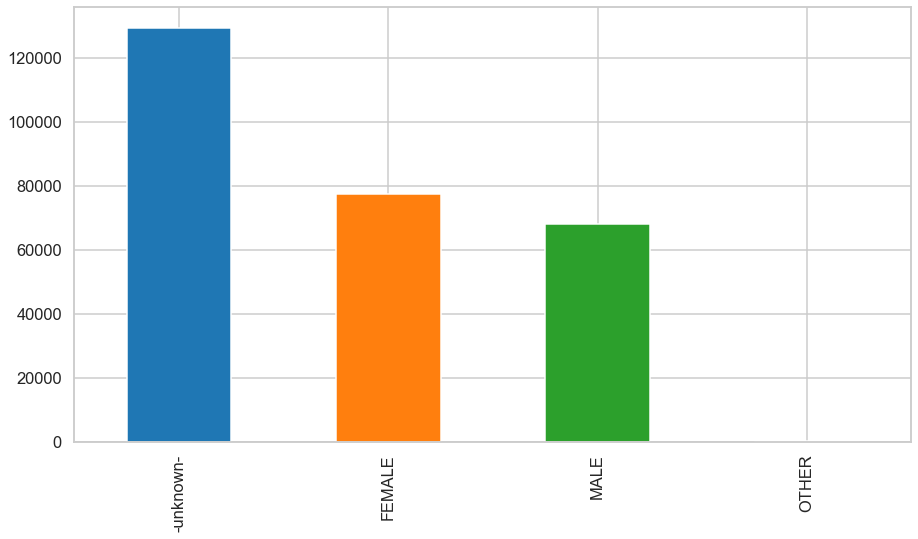

In [61]:
#gender 
plt.figure(figsize = (15,8))
df_all.gender.value_counts(dropna=True).plot(kind='bar',color = colors);
df_all['gender'].value_counts()


Mac Desktop           106328
Windows Desktop        86948
iPhone                 39814
iPad                   18036
Other/Unknown          11167
Android Phone           9458
Android Tablet          2098
Desktop (Other)         1507
SmartPhone (Other)       191
Name: first_device_type, dtype: int64

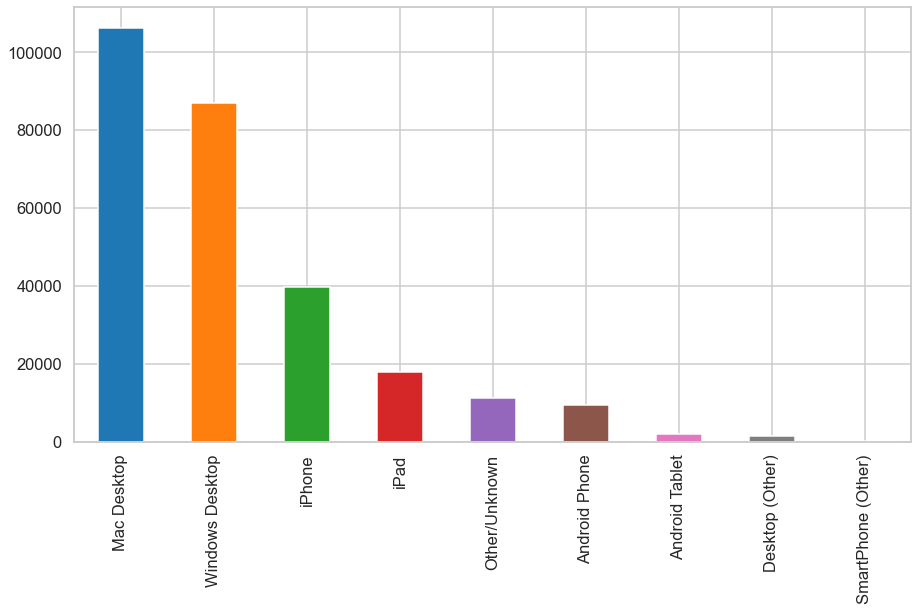

In [62]:
#first device type 
plt.figure(figsize = (15,8))
df_all.first_device_type.value_counts(dropna=True).plot(kind='bar',color = colors);
df_all['first_device_type'].value_counts()


Web        219918
iOS         34593
Android     10519
Moweb       10517
Name: signup_app, dtype: int64

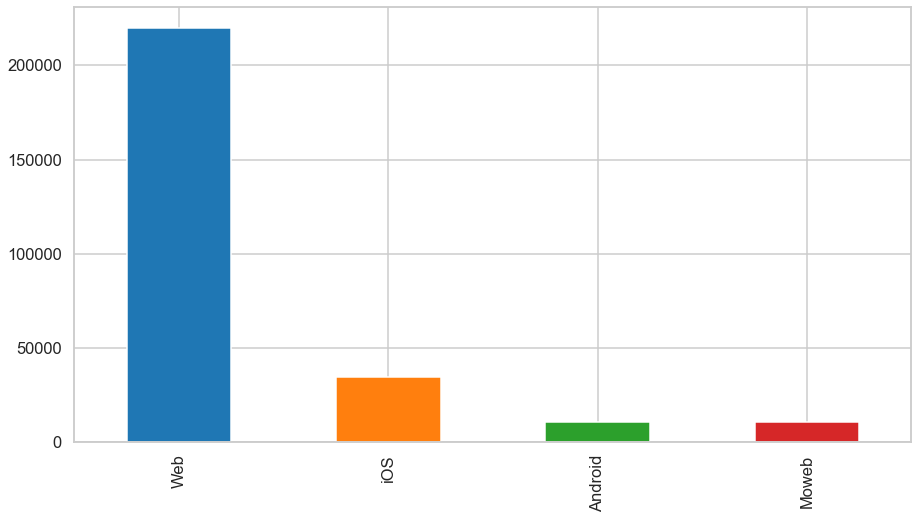

In [63]:
#signup app 
plt.figure(figsize = (15,8))
df_all.signup_app.value_counts(dropna=True).plot(kind='bar',color = colors);
df_all['signup_app'].value_counts()


basic       198222
facebook     74864
google        2438
weibo           23
Name: signup_method, dtype: int64

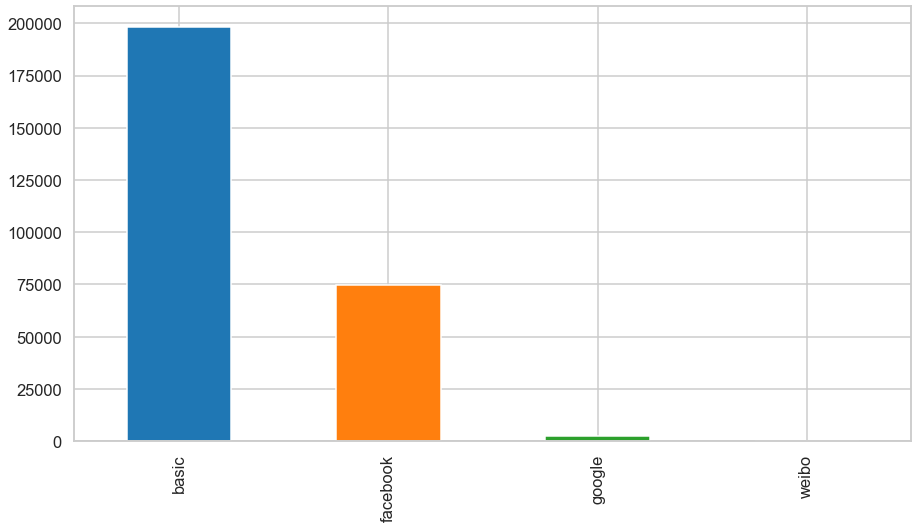

In [64]:
#signup method
plt.figure(figsize = (15,8))
df_all.signup_method.value_counts(dropna=True).plot(kind='bar',color = colors);
df_all['signup_method'].value_counts()


direct                 181270
google                  65956
other                   13036
facebook                 3996
bing                     3719
craigslist               3475
padmapper                 836
vast                      830
yahoo                     653
facebook-open-graph       566
gsp                       455
meetup                    358
email-marketing           270
naver                      66
baidu                      32
yandex                     18
wayn                        8
daum                        3
Name: affiliate_provider, dtype: int64

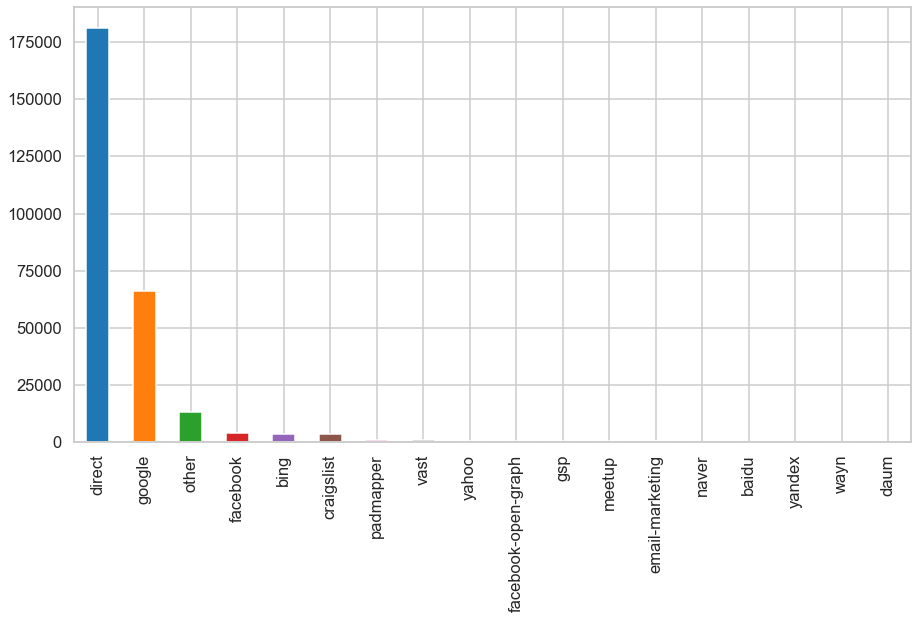

In [65]:
#affiliate provider
plt.figure(figsize = (15,8))
df_all.affiliate_provider.value_counts(dropna=True).plot(kind='bar',color = colors);
df_all['affiliate_provider'].value_counts()


0     206092
25     29834
12     11244
3       8822
2       6881
23      6408
24      4328
1       1047
8        315
6        301
21       197
5         36
20        14
16        11
15        10
14         4
10         2
4          1
Name: signup_flow, dtype: int64

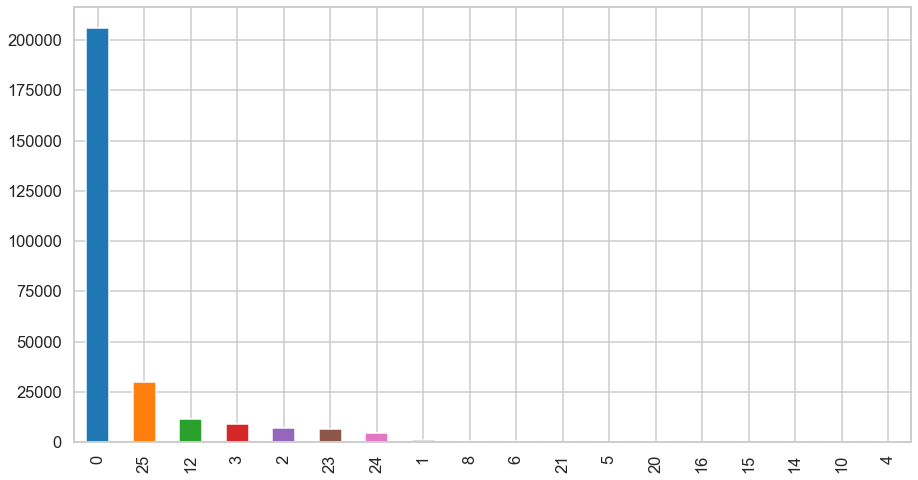

In [66]:
#signup flow 
plt.figure(figsize = (15,8))
df_all.signup_flow.value_counts(dropna=True).plot(kind='bar',color = colors);
df_all['signup_flow'].value_counts()


NDF      124543
US        62376
other     10094
FR         5023
IT         2835
GB         2324
ES         2249
CA         1428
DE         1061
NL          762
AU          539
PT          217
Name: country_destination, dtype: int64

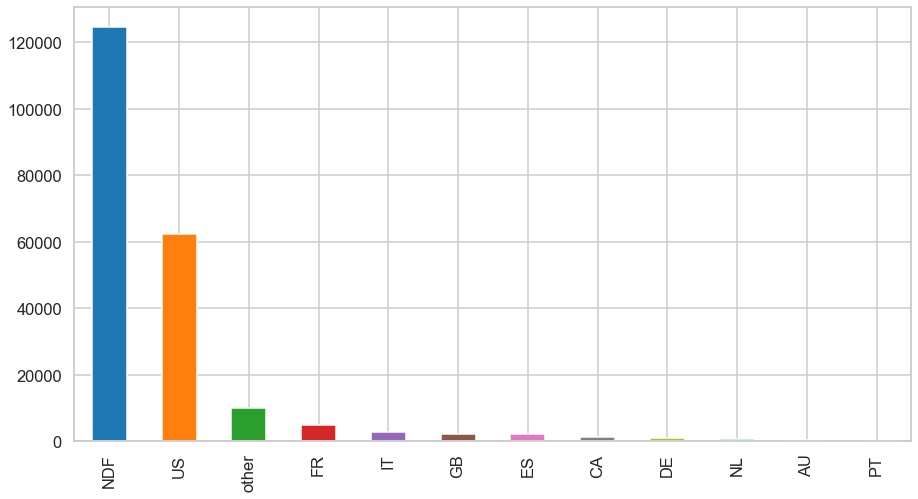

In [67]:
#country destination 
plt.figure(figsize = (15,8))
df_all.country_destination.value_counts(dropna=True).plot(kind='bar',color = colors);
df_all['country_destination'].value_counts()


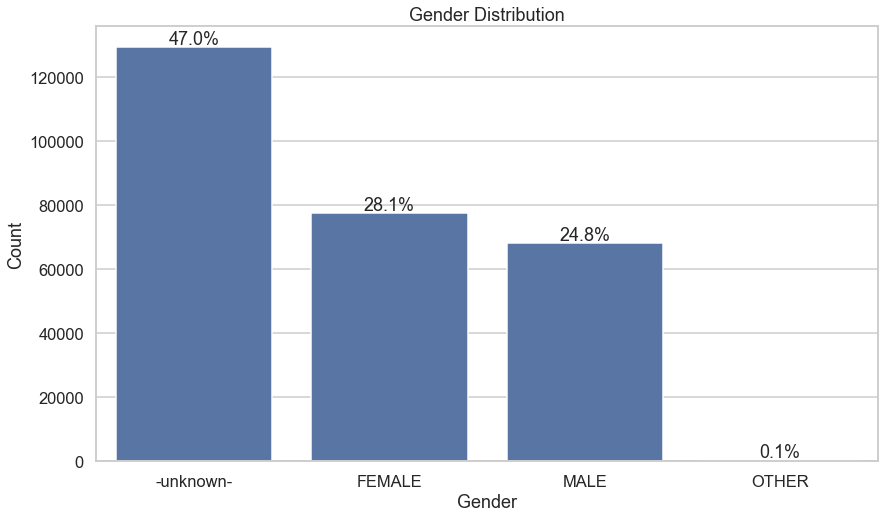

In [68]:
#Finding the gender distribution

plt.figure(figsize=(14,8))
order1 = df_all['gender'].value_counts().index #put count in order1
sns.countplot(data = df_all, x = 'gender', order = order1, color = sns.color_palette()[0])
plt.xlabel('Gender')
plt.ylabel('Count')
plt.title('Gender Distribution')


#to make %
order2 = df_all['gender'].value_counts()
for i in range(order2.shape[0]):   
    count = order2[i]
    strt='{:0.1f}%'.format(100*count / df_all.shape[0])
    plt.text(i,count+1000,strt,ha='center')

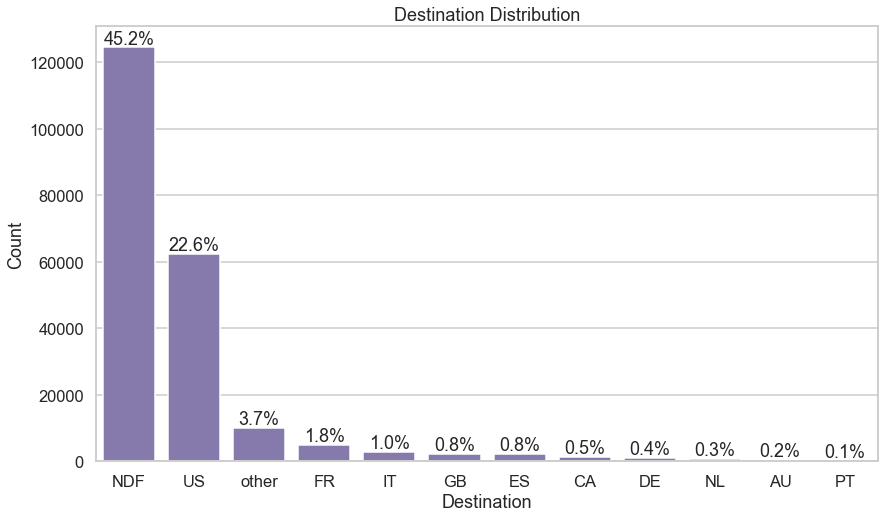

In [69]:
#Finding Destination Distribution.

plt.figure(figsize=(14,8))
order1 = df_all['country_destination'].value_counts().index
sns.countplot(data = data1, x = 'country_destination', order = order1, color = sns.color_palette()[4])
plt.xlabel('Destination')
plt.ylabel('Count')
plt.title('Destination Distribution')

#for make %
order2 = df_all['country_destination'].value_counts()
for i in range(order2.shape[0]):
    count = order2[i]
    strt='{:0.1f}%'.format(100*count / df_all.shape[0])
    plt.text(i,count+1000,strt,ha='center') #1000 for % postision 


In [70]:
#Extracting year for date_account_created
df_all['acc_year'] = df_all['date_account_created'].dt.year #add coloum acc year

df1 = df_all.groupby('acc_year').count() #groupby data
df1.head()


,id,date_account_created,timestamp_first_active,date_first_booking,gender,age,signup_method,signup_flow,language,affiliate_channel,affiliate_provider,first_affiliate_tracked,signup_app,first_device_type,first_browser,country_destination
acc_year,,,,,,,,,,,,,,,,
2010,2788,2788,2788,1603,2788,1706,2788,2788,2788,2788,2788,2003,2788,2788,2788,2788
2011,11775,11775,11775,6433,11775,7685,11775,11775,11775,11775,11775,9382,11775,11775,11775,11775
2012,39462,39462,39462,17749,39462,25722,39462,39462,39462,39462,39462,38155,39462,39462,39462,39462
2013,82960,82960,82960,33884,82960,48010,82960,82960,82960,82960,82960,82175,82960,82960,82960,82960
2014,138562,138562,138562,29239,138562,75558,138562,138562,138562,138562,138562,137747,138562,138562,138562,76466


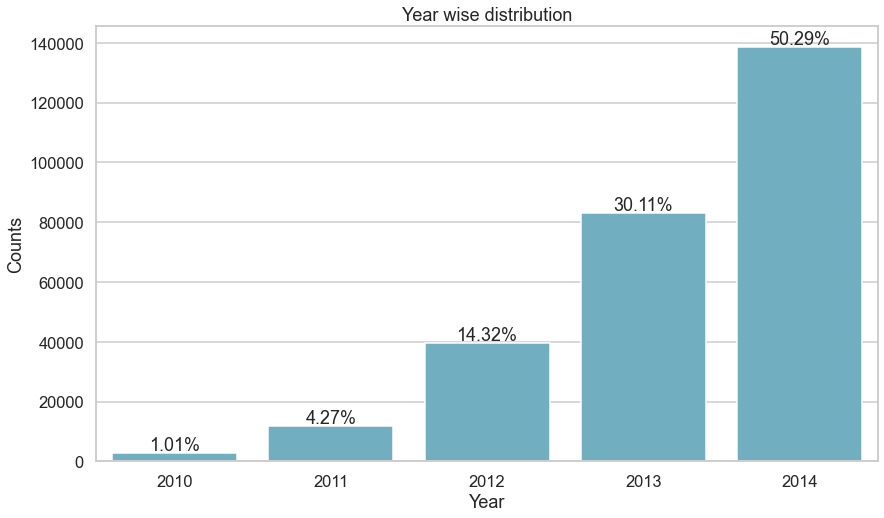

In [71]:
#Finding year distribution

years = [2010,2011,2012,2013,2014]
yearsOrder=pd.api.types.CategoricalDtype(ordered=True, categories=years)
df1.reset_index(inplace = True)
df1.acc_year = df1.acc_year.astype(yearsOrder)

plt.figure(figsize=[14,8])
sns.barplot(data=df1,x='acc_year',y='affiliate_provider',color=sns.color_palette()[9]);  #use any coloum in y as count
plt.title('Year wise distribution');
plt.xlabel('Year')
plt.ylabel('Counts')


for i in range(df1.shape[0]):
    count=df1.iloc[i]['affiliate_provider']
    strt='{:0.2f}%'.format(100*count/df_all.shape[0])
    plt.text(i,count+1000,strt,ha='center')

In [72]:
# Creating a month centered dataframe for 2014
df2 = df_all[df_all['date_account_created'].dt.year==2014]
df2['monthYear14'] = df2['date_account_created'].map(lambda x: x.strftime('%m-%Y')) #strftime from datetime library
df2 = df2.groupby('monthYear14').count()


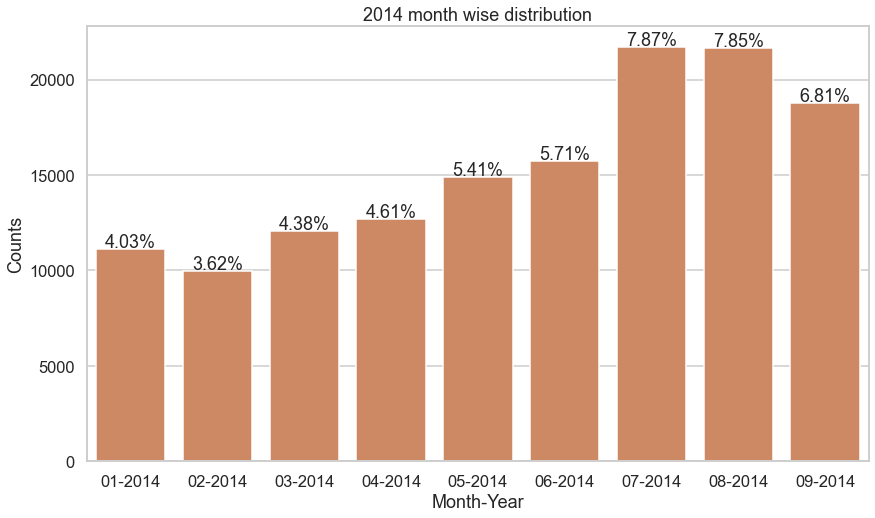

In [73]:
#Number of accounts created in different month of 2014

plt.figure(figsize=[14,8])
sns.barplot(data=df2,x=df2.index,y='affiliate_provider',color=sns.color_palette()[1]);
plt.title('2014 month wise distribution');
plt.xlabel('Month-Year')
plt.ylabel('Counts')

for i in range(df2.shape[0]):
    count=df2.iloc[i]['affiliate_provider']
    strt='{:0.2f}%'.format(100*count/df_all.shape[0])
    plt.text(i,count+100,strt,ha='center')

    #we noted that the dataset ended from collection at sep 2014

In [74]:
#Dividing member ages into various bins

df_all['member_age_bins']=df_all['age'].apply(lambda x: '18 - 20' if 18<x<=20
                                                  else '20 - 30' if 20<x<=30
                                                  else '30 - 40' if 30<x<=40
                                                  else '40 - 50' if 40<x<=50
                                                  else '50 - 60' if 50<x<=60
                                                  else '60-70' if 60<x<=70
                                                  else '70+' if 70<x<=100
                                                  else np.nan)

df_all.head()

,id,date_account_created,timestamp_first_active,date_first_booking,gender,age,signup_method,signup_flow,language,affiliate_channel,affiliate_provider,first_affiliate_tracked,signup_app,first_device_type,first_browser,country_destination,acc_year,member_age_bins
0,gxn3p5htnn,2010-06-28,2009-03-19 04:32:55,NaN,-unknown-,NaN,facebook,0,en,direct,direct,untracked,Web,Mac Desktop,Chrome,NDF,2010,NaN
1,820tgsjxq7,2011-05-25,2009-05-23 17:48:09,NaN,MALE,38.0,facebook,0,en,seo,google,untracked,Web,Mac Desktop,Chrome,NDF,2011,30 - 40
2,4ft3gnwmtx,2010-09-28,2009-06-09 23:12:47,2010-08-02,FEMALE,56.0,basic,3,en,direct,direct,untracked,Web,Windows Desktop,IE,US,2010,50 - 60
3,bjjt8pjhuk,2011-12-05,2009-10-31 06:01:29,2012-09-08,FEMALE,42.0,facebook,0,en,direct,direct,untracked,Web,Mac Desktop,Firefox,other,2011,40 - 50
4,87mebub9p4,2010-09-14,2009-12-08 06:11:05,2010-02-18,-unknown-,41.0,basic,0,en,direct,direct,untracked,Web,Mac Desktop,Chrome,US,2010,40 - 50


In [75]:
# Creating a month centered dataframe for 2014

df3 = df_all[df_all['date_account_created'].dt.year==2013]
df3['monthYear13'] = df3['date_account_created'].map(lambda x: x.strftime('%m-%Y'))
df3 = df3.groupby('monthYear13').count()


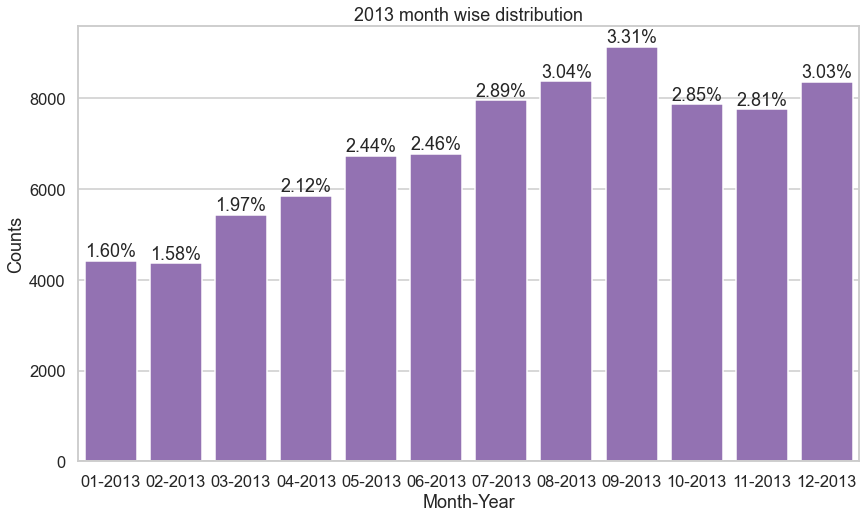

In [30]:
#Number of accounts created in different month of 2014

plt.figure(figsize=[14,8])
sns.barplot(data=df3,x=df3.index,y='affiliate_provider',color=sns.color_palette()[4]);
plt.title('2013 month wise distribution');
plt.xlabel('Month-Year')
plt.ylabel('Counts')

for i in range(df3.shape[0]):
    count=df3.iloc[i]['affiliate_provider']
    strt='{:0.2f}%'.format(100*count/df_all.shape[0])
    plt.text(i,count+100,strt,ha='center')


In [76]:
#boxpllot to age according to country destination before cleaning 
fig = px.box(df_all, y="age",x='country_destination')
fig.show()

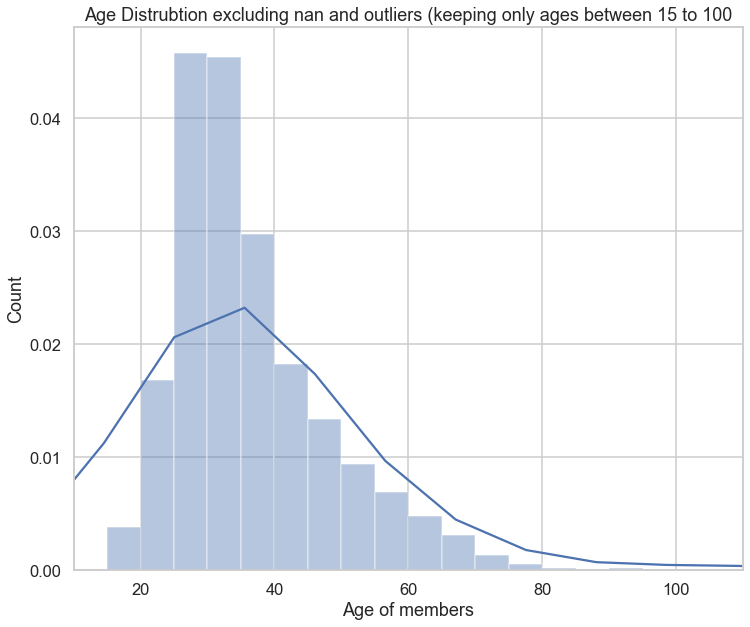

In [77]:
#Plotting Age distribution of the members
plt.figure(figsize=[12,10])
sns.distplot(df_all.age.dropna(),bins=np.arange(15,100,5),color=sns.color_palette()[0]); 
plt.xlabel('Age of members')
plt.ylabel('Count')
plt.title('Age Distrubtion excluding nan and outliers (keeping only ages between 15 to 100')
plt.xlim(10,110);


# bivariate 

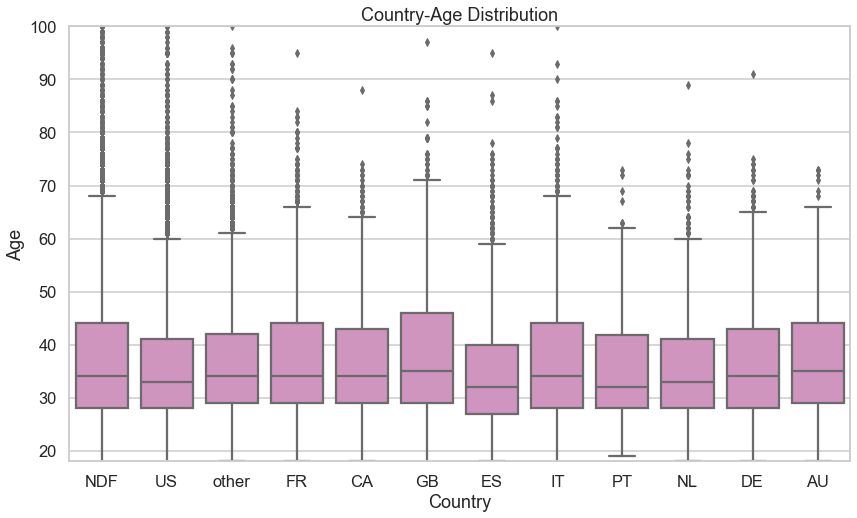

In [78]:
#Destination-Age distribution plot

plt.figure(figsize=[14,8])
sns.boxplot(data=df_all,y='age',x='country_destination',color=sns.color_palette()[6]);
plt.ylim(18,100)
plt.xlabel('Country');
plt.ylabel('Age');
plt.title('Country-Age Distribution');


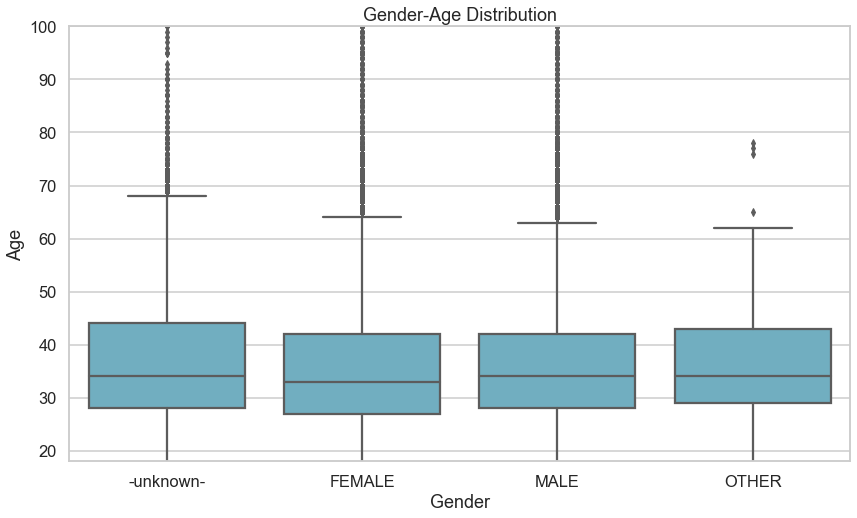

In [79]:
#Gender-Age Distribution plot

plt.figure(figsize=[14,8])
sns.boxplot(data=df_all,y='age',x='gender',color=sns.color_palette()[9]);
plt.ylim(18,100)
plt.xlabel('Gender');
plt.ylabel('Age');
plt.title('Gender-Age Distribution');

Text(0.5, 1.0, 'Gender-Destination Distribution')

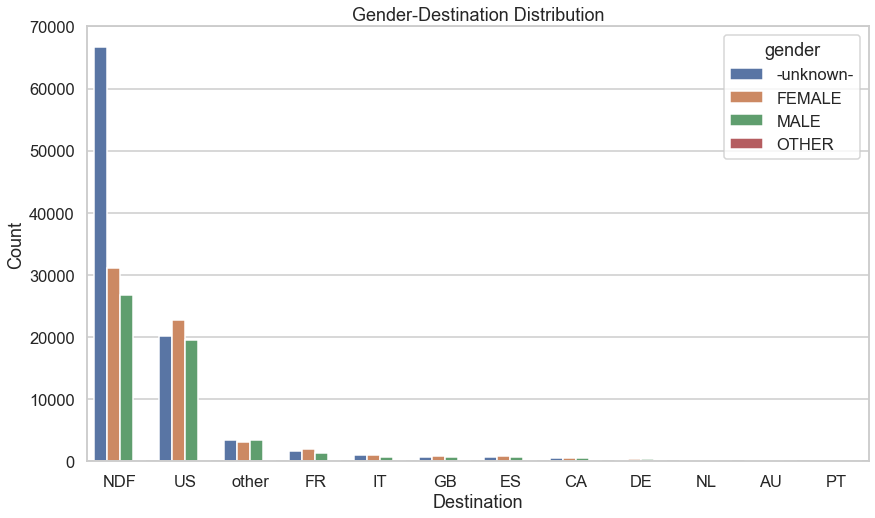

In [80]:
#Gender-Destination Distribution Plot

plt.figure(figsize=(14,8))
order1 = df_all['country_destination'].value_counts().index
sns.countplot(data = df_all, x = 'country_destination', order = order1,hue='gender')
plt.xlabel('Destination')
plt.ylabel('Count')
plt.title('Gender-Destination Distribution')


In [81]:
#account created month in 2013 only avvording to member age bins 
df3 = df_all[df_all['date_account_created'].dt.year==2013]
df3['monthYear13'] = df3['date_account_created'].map(lambda x: x.strftime('%m-%Y'))

df3= df3.groupby(['monthYear13','member_age_bins']).count()

df3.reset_index(inplace=True) # to inplace coloum in dataset

Text(0, 0.5, 'Counts')

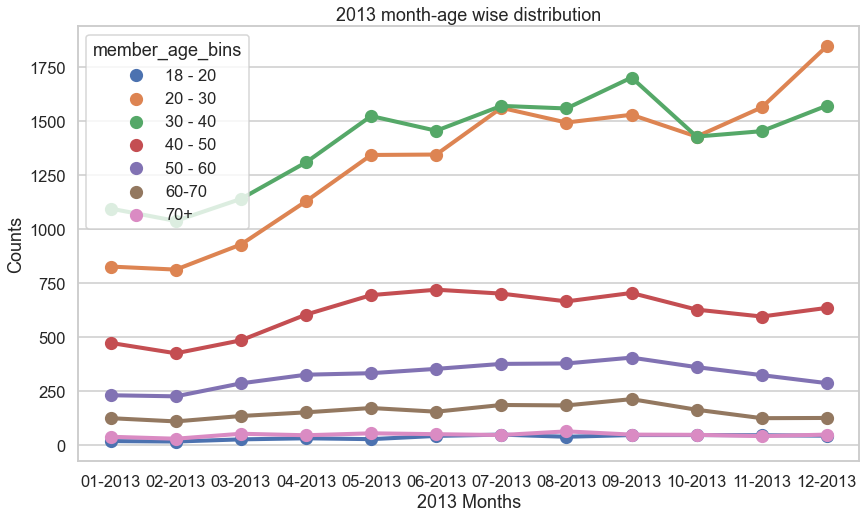

In [82]:
#Age wise distribution of the booking in different months of 2013

plt.figure(figsize=[14,8])
sns.pointplot(data=df3,x='monthYear13',y='affiliate_provider',hue='member_age_bins');
plt.title('2013 month-age wise distribution');
plt.xlabel('2013 Months')
plt.ylabel('Counts')


In [83]:
#account created month in 2013 only avvording to gender 

df3 = df_all[df_all['date_account_created'].dt.year==2013]
df3['monthYear13'] = df3['date_account_created'].map(lambda x: x.strftime('%m-%Y'))

df3= df3.groupby(['monthYear13','gender']).count() #this time wuth gender

df3.reset_index(inplace=True)

Text(0, 0.5, 'Counts')

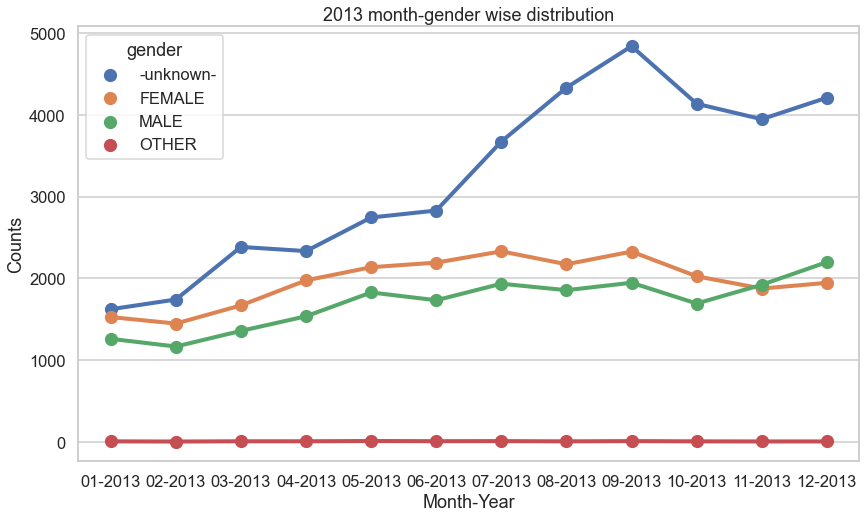

In [84]:
#Gender wise distribution of the booking in different months of 2013

plt.figure(figsize=[14,8])
sns.pointplot(data=df3,x='monthYear13',y='affiliate_provider',hue='gender');
plt.title('2013 month-gender wise distribution');
plt.xlabel('Month-Year')
plt.ylabel('Counts')


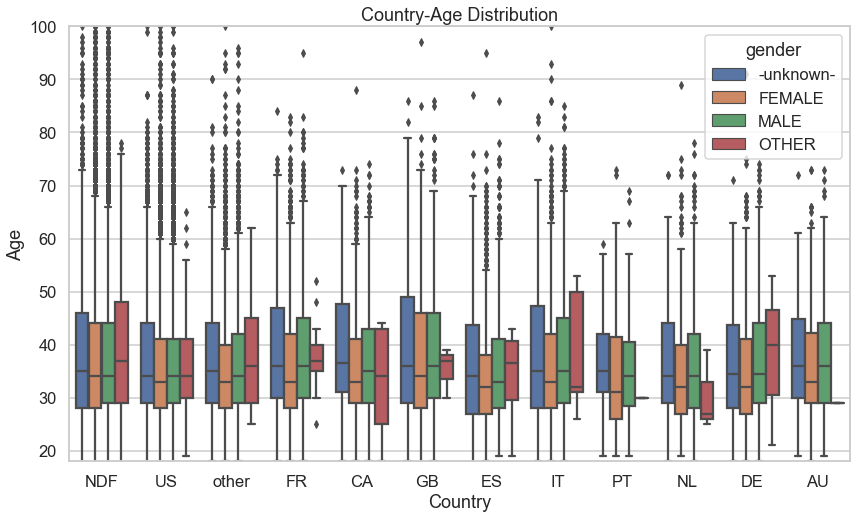

In [85]:
#Relation ship between age-gender-destination

plt.figure(figsize=[14,8])
sns.boxplot(data=df_all,y='age',x='country_destination',hue='gender');
plt.ylim(18,100)
plt.xlabel('Country');
plt.ylabel('Age');
plt.title('Country-Age Distribution');


# lets insights some category accorging to country destination 


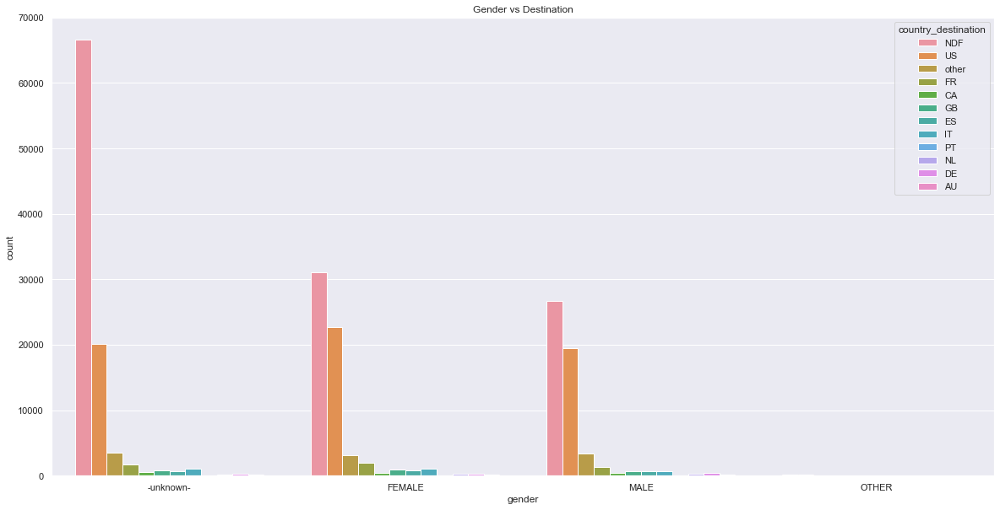

In [87]:
# gender share

plt.figure(figsize=(20,10))

sns.set(style="darkgrid")

ax = sns.countplot(x="gender", hue="country_destination", data=df_all)

plt.title("Gender vs Destination")

plt.show()

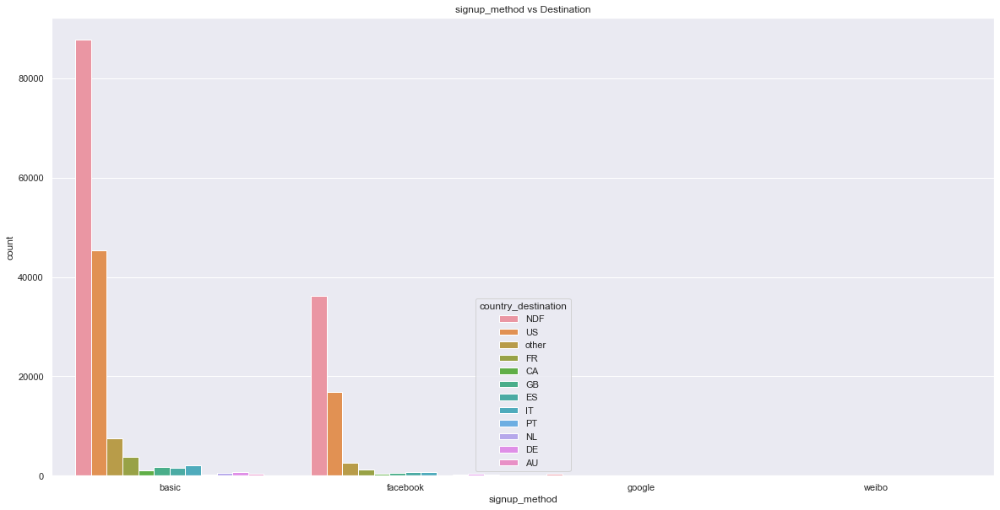

In [88]:
# signup_method share

plt.figure(figsize=(20,10))

sns.set(style="darkgrid")

ax = sns.countplot(x="signup_method", hue="country_destination", data=df_all)

plt.title("signup_method vs Destination")

plt.show()


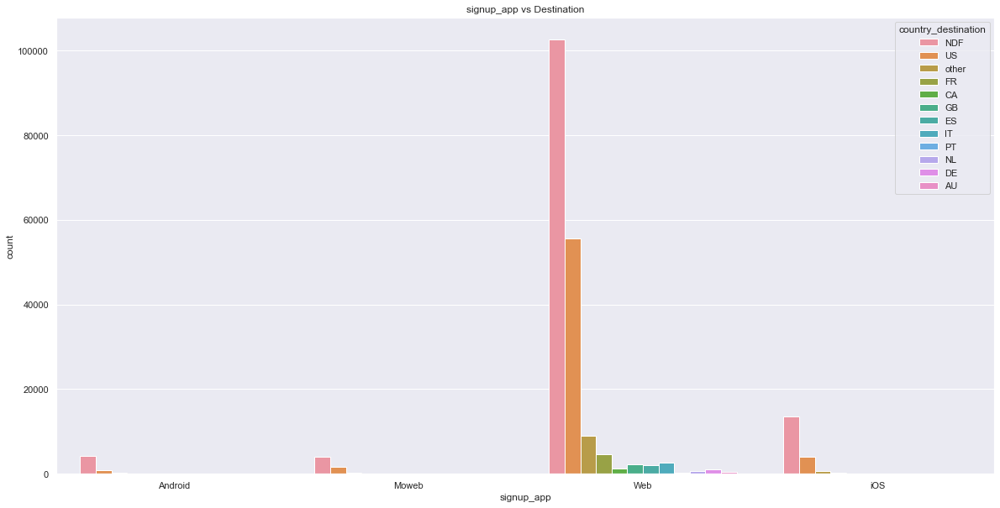

In [89]:
# signup_app share

plt.figure(figsize=(20,10))

sns.set(style="darkgrid")

ax = sns.countplot(x="signup_app", hue="country_destination", data=df_all)

plt.title("signup_app vs Destination")

plt.show()

# use Z-score to remove outliers 

In [90]:
df_all['zscore'] = ( df_all.age - df_all.age.mean() ) / df_all.age.std()
df_all.shape

(275547, 19)

In [91]:
df_all.head(5)

,id,date_account_created,timestamp_first_active,date_first_booking,gender,age,signup_method,signup_flow,language,affiliate_channel,affiliate_provider,first_affiliate_tracked,signup_app,first_device_type,first_browser,country_destination,acc_year,member_age_bins,zscore
0,gxn3p5htnn,2010-06-28,2009-03-19 04:32:55,NaN,-unknown-,NaN,facebook,0,en,direct,direct,untracked,Web,Mac Desktop,Chrome,NDF,2010,NaN,NaN
1,820tgsjxq7,2011-05-25,2009-05-23 17:48:09,NaN,MALE,38.0,facebook,0,en,seo,google,untracked,Web,Mac Desktop,Chrome,NDF,2011,30 - 40,-0.064119
2,4ft3gnwmtx,2010-09-28,2009-06-09 23:12:47,2010-08-02,FEMALE,56.0,basic,3,en,direct,direct,untracked,Web,Windows Desktop,IE,US,2010,50 - 60,0.062082
3,bjjt8pjhuk,2011-12-05,2009-10-31 06:01:29,2012-09-08,FEMALE,42.0,facebook,0,en,direct,direct,untracked,Web,Mac Desktop,Firefox,other,2011,40 - 50,-0.036075
4,87mebub9p4,2010-09-14,2009-12-08 06:11:05,2010-02-18,-unknown-,41.0,basic,0,en,direct,direct,untracked,Web,Mac Desktop,Chrome,US,2010,40 - 50,-0.043086


In [92]:
#remove all values out of range 3 and -3 
df_no_outliers = df_all[(df_all.zscore>-3) & (df_all.zscore<3)]
df_no_outliers.shape

(157853, 19)

In [93]:
df_no_outliers.head(5)

,id,date_account_created,timestamp_first_active,date_first_booking,gender,age,signup_method,signup_flow,language,affiliate_channel,affiliate_provider,first_affiliate_tracked,signup_app,first_device_type,first_browser,country_destination,acc_year,member_age_bins,zscore
1,820tgsjxq7,2011-05-25,2009-05-23 17:48:09,NaN,MALE,38.0,facebook,0,en,seo,google,untracked,Web,Mac Desktop,Chrome,NDF,2011,30 - 40,-0.064119
2,4ft3gnwmtx,2010-09-28,2009-06-09 23:12:47,2010-08-02,FEMALE,56.0,basic,3,en,direct,direct,untracked,Web,Windows Desktop,IE,US,2010,50 - 60,0.062082
3,bjjt8pjhuk,2011-12-05,2009-10-31 06:01:29,2012-09-08,FEMALE,42.0,facebook,0,en,direct,direct,untracked,Web,Mac Desktop,Firefox,other,2011,40 - 50,-0.036075
4,87mebub9p4,2010-09-14,2009-12-08 06:11:05,2010-02-18,-unknown-,41.0,basic,0,en,direct,direct,untracked,Web,Mac Desktop,Chrome,US,2010,40 - 50,-0.043086
6,lsw9q7uk0j,2010-01-02,2010-01-02 01:25:58,2010-01-05,FEMALE,46.0,basic,0,en,other,craigslist,untracked,Web,Mac Desktop,Safari,US,2010,40 - 50,-0.008030


# summary 